# Visualização com mapas interativos

* Obs :Necessita dos arquivos já criados no Geo Pandas-RJ-1

# Fontes:

ftp://geoftp.ibge.gov.br/recortes_para_fins_estatisticos/malha_de_setores_censitarios/censo_2010/base_de_faces_de_logradouros/RJ/


https://cidades.ibge.gov.br/brasil/rj/rio-de-janeiro/panorama


ftp://ftp.ibge.gov.br/Censos/Censo_Demografico_2010/Resultados_do_Universo.

# Preparar ambiente

In [131]:
%matplotlib inline
import pandas as pd
import geopandas as gpd
import os
import zipfile
import shutil
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap

# 1. Setores Censitários

O setor censitário é a unidade territorial estabelecida para fins de controle cadastral, formado por área contínua, situada em um único quadro urbano ou rural, com dimensão e número de domicílios que permitam o levantamento por um recenseador

## Tramento de dados zipados
(Manipulação de diretórios e arquivos com Pythom)

In [132]:
# Criar o diretório temporário
dir = 'Dados/Mapas/RJ-SETOR/TEMP'
if not os.path.exists(dir):
    os.makedirs(dir)

In [133]:
# Ler os arquivos  dentro das pasta
filenames = []

for raiz, diret, arquivos in os.walk('Dados/Mapas/RJ-SETOR/DADOS'):
      filenames=arquivos

In [134]:
#Extrair para pasta TEMP

for item in filenames:
    zip_ref = zipfile.ZipFile('Dados/Mapas/RJ-SETOR/DADOS/'+ item ,'r')
    zip_ref.extractall(dir)
    zip_ref.close()

In [135]:
#construtor de GeoDataFrame
# [gpd.read_file(dir + '/' + item[:-4] +'_setor.shp') for item in filenames]

In [136]:
# Passare lista ainda para concatenar
setor = pd.concat([gpd.read_file(dir + '/' + item[:-4] +'_setor.shp') for item in filenames])

In [137]:
# Eliminar os arquivos temporários 
shutil.rmtree(dir)

In [138]:
# Vislzar dados
setor.head()

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,NM_MUNICIP,NM_MESO,NM_MICRO,geometry
0,400341,330455705060018,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.2127456513088 -22.8752532782879,..."
1,400342,330455705060019,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.2131379980493 -22.8749328328656,..."
2,400343,330455705060020,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.2132713666263 -22.8730867476421,..."
3,400344,330455705060021,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.2115021597463 -22.8742318574333,..."
4,400347,330455705060024,URBANO,330455705003,Santo Cristo,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.2074274030339 -22.9073057629998,..."


In [139]:
#Coverter crs
setor = setor.to_crs ('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
setor.crs

'+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs'

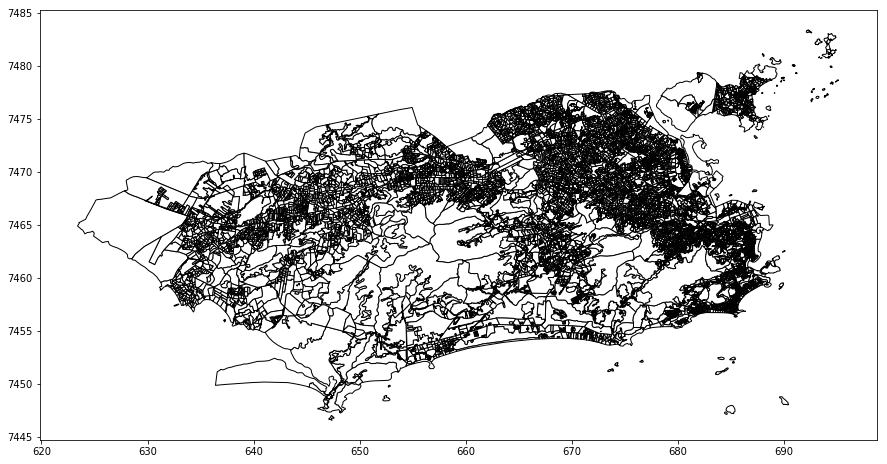

In [140]:
# Visulizar mapa dos setores censitários
setor.plot(color='white', edgecolor='black', figsize=(15,8))

In [141]:
#Salvar
setor.to_file('Dados/Mapas/RJ-SETOR/RJ-SETOR.shp')

## Trabalhando com bairros epecíficos

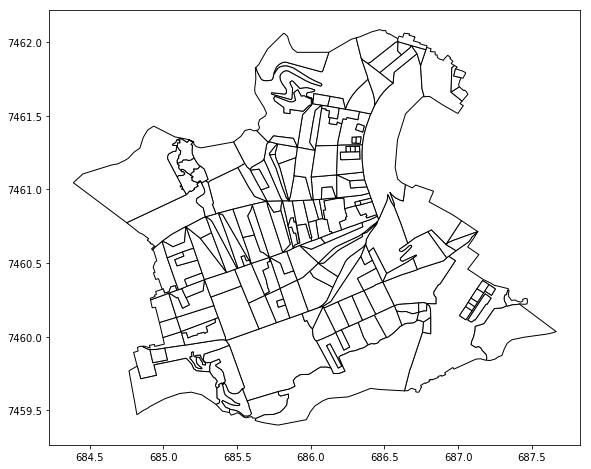

In [142]:
# BOTAFOGO
botafogo=setor[setor['NM_BAIRRO']=='Botafogo']
botafogo.plot(color='white', edgecolor='black', figsize=(15,8))

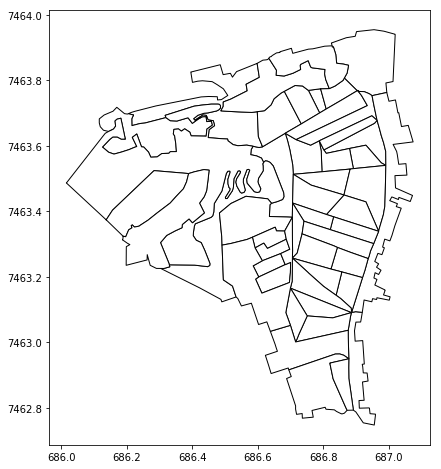

In [143]:
# CATETE
catete=setor[setor['NM_BAIRRO']=='Catete']
catete.plot(color='white', edgecolor='black', figsize=(15,8))

# 2. Juntando datasets ao GeoDataFrame

In [144]:
censo = pd.read_excel('Dados/Censo 2010/RJ/EXCEL/Basico_RJ.xls')

In [145]:
# converter arquivo do censo
censo['Cod_setor']=censo['Cod_setor'].astype(str)

In [146]:
# Juntar informações
setor = pd.merge(setor, censo, left_on='CD_GEOCODI', right_on='Cod_setor', how='left')
setor.head()

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,400341,330455705060018,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,...,2.91,1.77,687.86,607487.37,1162.52,474104.49,468.88,439565.17,993.66,410002.85
1,400342,330455705060019,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,...,2.64,2.06,645.95,443290.44,955.47,359529.36,436.96,323403.61,844.44,280771.01
2,400343,330455705060020,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,...,2.76,1.72,788.46,532814.72,1042.81,437929.47,536.64,468960.56,971.76,425985.79
3,400344,330455705060021,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,...,2.56,2.57,635.00,587850.00,1018.65,551834.99,323.89,379860.88,1008.94,493116.72
4,400347,330455705060024,URBANO,330455705003,Santo Cristo,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,...,3.13,2.49,568.02,173698.43,679.01,131792.80,378.96,177655.16,645.64,130200.18


In [147]:
# Importar datasets feitos no 1º parte
geo_dados = gpd.read_file('Dados/Mapas/RJ-DATASET/DATASET.shp')
rj= gpd.read_file('Dados/Mapas/RJ-MUNIC/RJ-MUNIC.shp')

#Coverter crs
setor = setor.to_crs ('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
geo_dados=geo_dados.to_crs ('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
rj=rj.to_crs ('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

#Elimiar pontos fora do município
geo_dados=geo_dados[geo_dados['geometry'].within(rj.iloc[0].geometry)]

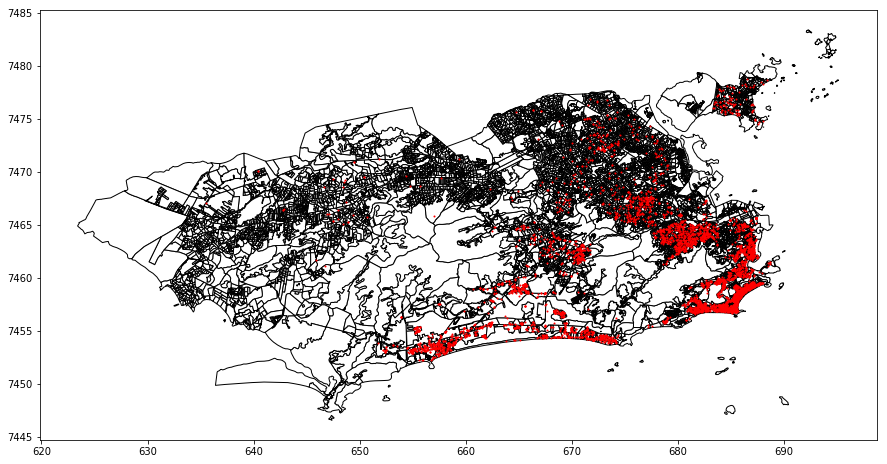

In [148]:
#Visulizar
base = setor.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax = base, color='red', markersize=1)

In [149]:
# Agupar e salvar
geo_dados = geo_dados[~geo_dados.index.duplicated(keep='first')]
geo_dados.to_file('Dados/Mapas/RJ-DATASET/DATASET.shp')

## Agregando regiões geográficas

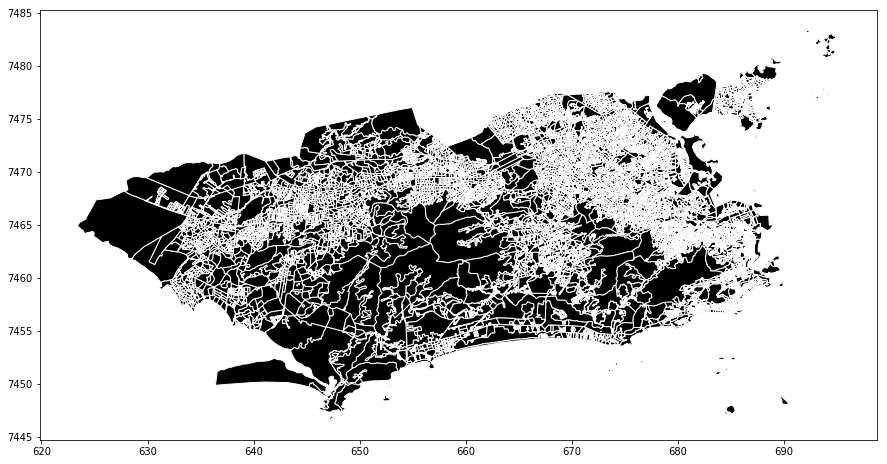

In [150]:
setor = gpd.read_file('Dados/Mapas/RJ-SETOR/RJ-SETOR.shp')
setor.plot(color='black', edgecolor='white', figsize=(15, 8))

In [151]:
# Disolver regiões censitárias
setor = setor.to_crs({'init': 'epsg:4326'})
setor_m = setor[['NM_BAIRRO', 'geometry']]
bairro = setor_m.dissolve(by='NM_BAIRRO')

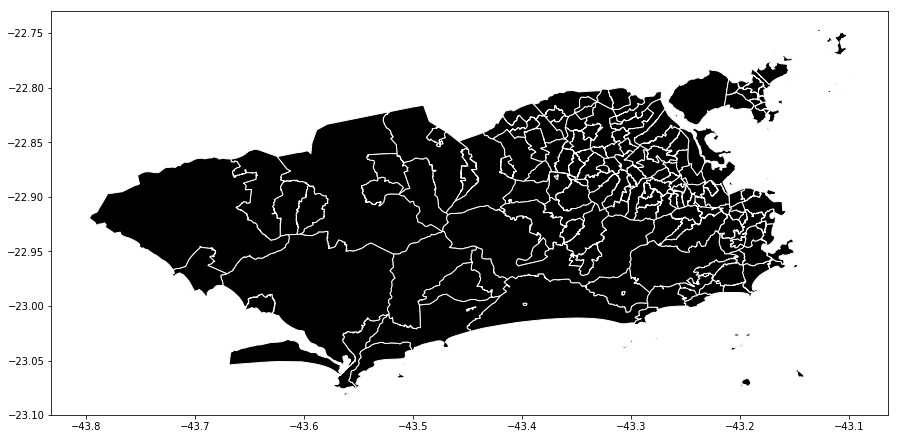

In [152]:
teicdcds

In [153]:
setor.head(3)

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,NM_MUNICIP,NM_MESO,NM_MICRO,geometry
0,400341,330455705060018,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,POLYGON ((-43.2127456513088 -22.87525327828789...
1,400342,330455705060019,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.2131379980493 -22.8749328328656,..."
2,400343,330455705060020,URBANO,330455705004,Caju,330455705,RIO DE JANEIRO,330455705,PORTUÁRIA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,POLYGON ((-43.2132713666263 -22.87308674764209...


In [154]:
#Agregar infomação pupulacional
setor = pd.merge(setor, censo, left_on='CD_GEOCODI', right_on='Cod_setor', how='left')
setor_m = setor[['NM_BAIRRO', 'geometry', 'V002']]
bairro = setor_m.dissolve(by='NM_BAIRRO', aggfunc='sum')

In [155]:
# População associada a geometria
bairro.head(2)

,geometry,V002
NM_BAIRRO,,
Abolição,POLYGON ((-43.2948946607115 -22.88916168148589...,11356.0
Acari,"POLYGON ((-43.3388200954628 -22.8265849731976,...",26967.0


In [156]:
# Mudar crs
bairro = bairro.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
bairro.reset_index(inplace=True)

In [157]:
#Salvar
dir = 'Dados/Mapas/RJ-BAIRRO'
if not os.path.exists(dir):
    os.makedirs(dir)
    
bairro.to_file(dir + '/RJ-BAIRRO.shp')

# 3.Folium 
O propósito dessa biblioteca é unir o poder de manipulação de dados que Python possui com a força de visualização de mapas da biblioteca JavaScript Leaflet. A ideia aqui é tornar ainda mais fácil a missão de colocar pontos em um mapa.

In [158]:
rj = gpd.read_file('Dados/Mapas/RJ-MUNIC/RJ-MUNIC.shp')
geo_dados = gpd.read_file('Dados/Mapas/RJ-DATASET/DATASET.shp')
bairro = gpd.read_file('Dados/Mapas/RJ-BAIRRO/RJ-BAIRRO.shp')

In [159]:
# Definir crs padrão
crs = {'init': 'epsg:4326'}
setor=setor.fillna(0)
rj.to_crs(crs,inplace=True)

In [160]:
#Cacular centroide
y=rj.centroid.y.iloc[0]
x=rj.centroid.x.iloc[0]

## Mapa sem camadas

In [161]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
base.choropleth(rj)
base

In [162]:
# Mapa com label simples (Click)
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
geojson_rj = folium.GeoJson(rj)
geojson_rj.add_child(folium.Popup(rj.NM_MUNICIP.iloc[0]))
geojson_rj.add_to(base)
base

## Mapa com camadas

In [163]:
#Coverter crs do bairro
bairro.to_crs(crs, inplace=True)

#Mapa base
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
for i in range(len(bairro)):
    geo = folium.GeoJson(bairro[i: i + 1],name=bairro['NM_BAIRRO'][i])
    label = '{} - {} habitantes'.format(bairro['NM_BAIRRO'][i], bairro['V002'][i])
    folium.Popup(label).add_to(geo)
    geo.add_to(base)
    
#Controle de camadas    
folium.LayerControl().add_to(base)

#Salvar
base.save('Bairros (RJ).html')

#Exibir
base

## Usando marcadores

* Dados referentes ao  aluguel de imovéis 

In [164]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
base.choropleth(rj,
               name="Rio de Janeiro",
               line_color="Black",
               line_weight=3,
               fill_opacity=0)

amostra = geo_dados.sample(500)

#https://fontawesome.com/icons?from=io

for item in amostra.itertuples():
    base.add_child(folium.Marker(location=[item.Latitude, item.Longitude],
                                popup="<h4>"+str(item.Tipo)+"</h4> <h5>"+str(item.Bairro)+"</h5> <p>R$ "+str(item.Valor)+",00</p>",
                                icon=folium.Icon(color='red',
                                                 prefix='fa',
                                                 icon='fas fa-home')
                                )
                  )
    
folium.LayerControl().add_to(base)

base.save('Dataset Marcadores.html')                   

base

## Marcadores clusterizados (use o zoom)

* Dados referentes ao aluguel de imovéis 

In [165]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
base.choropleth(rj,
               name="Rio de Janeiro",
               line_color="Black",
               line_weight=3,
               fill_opacity=0)

cluster = MarkerCluster()

for item in geo_dados.itertuples():
    cluster.add_child(folium.Marker(location=[item.Latitude, item.Longitude],
                                popup="<h4>"+str(item.Tipo)+"</h4> <h5>"+str(item.Bairro)+"</h5> <p>R$ "+str(item.Valor)+",00</p>",
                                icon=folium.Icon(color='red',
                                                 prefix='fa',
                                                 icon='fas fa-home')
                                )
                  )
    
base.add_child(cluster)

folium.LayerControl().add_to(base)

base.save('Dataset Marcadores Clusterizados.html')

base

## Mapa de calor (use o zoom)

* Dados referentes ao número de habitantes


In [166]:
data = []
for i in range(len(setor)):
    data.append([setor['geometry'][i].centroid.y,
                 setor['geometry'][i].centroid.x,
                 setor['V002'][i]/setor['V002'].max()])
    
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
HeatMap(data, name="População").add_to(base)
folium.LayerControl().add_to(base)
base.save('HeatMap.html')
base